# Analysing the data collected from Bagamoyo

### Imports and folder intitialisation

In [2]:
import sys
import os
import random
import glob
from imutils import face_utils
import numpy as np
import argparse
import imutils
import dlib
import cv2
import math
import matplotlib
import matplotlib.pyplot as plt
import gc
%matplotlib inline

In [3]:
from skimage.feature import hog
from skimage import data,exposure

In [4]:
from tqdm import tqdm
from time import sleep

In [5]:
from bcolz import carray

In [6]:
#contains videos
data_folder_1='/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/2018-05-16_bagamoyo_village_elicited_expressions/'

In [7]:
dest_folder='/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-16/'

In [ ]:
!ls {data_folder_1}

### Extracting frames for kids


In [8]:
video_files_list=glob.glob(data_folder_1+'/*')

In [18]:
dest_folder+os.path.splitext(os.path.basename(video_files_list[0]))[0]

'/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-16/VIDEO_00-male-surprise_20180516_091529_219393302'

In [20]:
for f in video_files_list:
    dest_folder_name=dest_folder+os.path.splitext(os.path.basename(f))[0]
    if not os.path.exists(dest_folder_name):
        os.makedirs(dest_folder_name)

In [21]:
video_files_list[0]

'/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/2018-05-16_bagamoyo_village_elicited_expressions/VIDEO_00-male-surprise_20180516_091529_219393302.mp4'

In [35]:
!{video_files_list[0]}

/bin/sh: 1: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/2018-05-16_bagamoyo_village_elicited_expressions/VIDEO_00-male-surprise_20180516_091529_219393302.mp4: Permission denied


In [ ]:
for f in video_files_list:
#     !ffmpeg -i "{f}" -q:v 1 "{dest_folder}/{os.path.splitext(os.path.basename(f))[0]}/%01d.jpeg"

In [ ]:
# !ffmpeg -i "{video_files_list[0]}" -q:v 1 "{dest_folder}/{os.path.splitext(os.path.basename(video_files_list[0]))[0]}/%01d.jpeg"

In [ ]:
data_folder_1='/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/05-17_part1/'

dest_folder='/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/'

video_files_list=glob.glob(data_folder_1+'/*')

for f in video_files_list:
    dest_folder_name=dest_folder+os.path.splitext(os.path.basename(f))[0]
    if not os.path.exists(dest_folder_name):
        os.makedirs(dest_folder_name)

for f in video_files_list:
#     !ffmpeg -i "{f}" -q:v 1 "{dest_folder}/{os.path.splitext(os.path.basename(f))[0]}/%01d.jpeg"

In [ ]:
#saving frames of videos
data_folder_1='/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/05-17_part2/'

dest_folder='/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/'

video_files_list=glob.glob(data_folder_1+'/*')

for f in video_files_list:
    dest_folder_name=dest_folder+os.path.splitext(os.path.basename(f))[0]
    if not os.path.exists(dest_folder_name):
        os.makedirs(dest_folder_name)

for f in video_files_list:
#     !ffmpeg -i "{f}" -q:v 1 "{dest_folder}/{os.path.splitext(os.path.basename(f))[0]}/%01d.jpeg"

# Analysing Face Detection

<type 'str'>


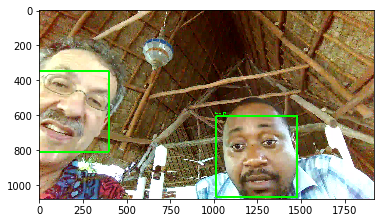

In [82]:
samp_path=random.sample(frames_list,1)[0]
print(type(samp_path))
image=cv2.imread(samp_path)
gray=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
rects=detector(gray,1)
for i,rect in enumerate(rects):
    shape = predictor(gray, rect)
    shape = face_utils.shape_to_np(shape)
    (x, y, w, h) = face_utils.rect_to_bb(rect)
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 10)
    # show the face number
    cv2.putText(image, "Face #{}".format(i + 1), (x - 10, y - 10),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    

('number of images should be: ', 273)


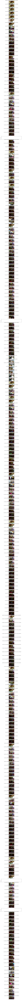

In [19]:
frames_list=video_frames_05_16
print("number of images should be: ", len(frames_list))
validate_fig,validate_axes=plt.subplots(len(frames_list[:]),1,sharex=True,sharey=True,figsize=(10,500))
for vid_no,vid_folder in enumerate(frames_list[:]):
    try:
        frames_list=(glob.glob(vid_folder+'/*'))
        samp_path=random.sample(frames_list,1)[0]
        image=cv2.imread(samp_path)
        gray=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
        rects=detector(gray,1)
        for i,rect in enumerate(rects):
            shape = predictor(gray, rect)
            shape = face_utils.shape_to_np(shape)
            (x, y, w, h) = face_utils.rect_to_bb(rect)
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 10)
            # show the face number
            cv2.putText(image, "Face #{}".format(i + 1), (x - 10, y - 10),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        validate_axes[vid_no].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
        validate_axes[vid_no].set_title(str(vid_no)+"_"+os.path.basename(vid_folder))
    except KeyboardInterrupt:
        break
    except:
        continue
        

### Calculating FAU using OpenFace

In [8]:
bagamoyo_folder="/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/"
frames_folder=bagamoyo_folder+"frames/05-17/"
frames_folder

'/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/'

In [9]:
videos_folder=bagamoyo_folder+"videos/"
videos_folder

'/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/videos/'

In [10]:
openface_features_folder=bagamoyo_folder+"openface_features/"
if not os.path.exists(openface_features_folder):
    os.makedirs(openface_features_folder)
print(openface_features_folder)
!ls {openface_features_folder}

/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/openface_features/
2


In [11]:
openface_features_folder

'/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/openface_features/'

In [12]:
os.listdir("/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/sample/")[0]

'VIDEO_00-male-surprise_20180516_091529_219393302.mp4'

We have to use FaceLandmarkImg since face tracking in multiple frames is not present. FaceLandmarkImg uses images individually(not in a sequence) to process multiple faces. Make sure to use appropriate flags: https://github.com/TadasBaltrusaitis/OpenFace/wiki/Command-line-arguments

In [ ]:
for vid_folder in tqdm(glob.glob(frames_folder+'/*')):
    print ("processing: ",vid_folder)
    #making the folder to save features
    features_dest_folder = openface_features_folder+os.path.basename(vid_folder)
    if not os.path.exists(features_dest_folder):
        os.makedirs(features_dest_folder)
    try:
        !~/cmu/OpenFace/build/bin/FaceLandmarkImg -fdir {vid_folder} -out_dir {features_dest_folder} -wild
    except KeyboardInterrupt:
        break
    except:
        continue

    
#     ! ~/cmu/OpenFace/build/bin/FaceLandmarkImg -fdir "" -au -nomask -g hogalign -aus -pose -gaze

  0%|          | 0/527 [00:00<?, ?it/s]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_1526475571181 bored_20180517_051006_925186803')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_1526475571181
terminate called after throwing an instance of 'boost::filesystem::filesystem_error'
  what():  boost::filesystem::directory_iterator::construct: No such file or directory: "/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_1526475571181"
Aborted (core dumped)


  0%|          | 1/527 [00:00<02:21,  3.72it/s]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091529_219393302')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091529_219393302
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/p

  0%|          | 2/527 [01:25<6:14:06, 42.75s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091541_1754978908')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091541_1754978908
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model

  1%|          | 3/527 [02:41<7:51:14, 53.96s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091551_1272027070')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091551_1272027070
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model

  1%|          | 4/527 [04:49<10:31:19, 72.43s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091601_315735604')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091601_315735604
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/p

  1%|          | 5/527 [07:58<13:52:54, 95.74s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091612_1350564397')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091612_1350564397
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model

  1%|          | 6/527 [10:31<15:14:18, 105.29s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091622_222850491')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091622_222850491
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/p

  1%|▏         | 7/527 [12:23<15:20:45, 106.24s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091859_1464474503')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091859_1464474503
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model

  2%|▏         | 8/527 [13:57<15:05:56, 104.73s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091908_1711675951')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_091908_1711675951
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model

  2%|▏         | 9/527 [15:35<14:57:30, 103.96s/it]

('processing: ', '/media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_103058_1712496391')
Attempting to read from directory: /media/amogh/Stuff/CMU/datasets/bagamoyo_2018-05-16_elicited_expressions/frames/05-17/VIDEO_00-male-surprise_20180516_103058_1712496391
Loading the model
Reading the CLNF landmark detector/tracker from: /home/amogh/cmu/OpenFace/build/bin/model/main_clnf_general.txt
Reading the landmark detector module from: /home/amogh/cmu/OpenFace/build/bin/model/clnf_general.txt
Reading the PDM module from: /home/amogh/cmu/OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: /home/amogh/cmu/OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model/patch_experts/ccnf_patches_0.25_general.txt....Done
Reading the intensity CCNF patch experts from: /home/amogh/cmu/OpenFace/build/bin/model

In [ ]:
FeatureExtraction -fdir "" -au_static -outdir "" #for one face, definitely not of use
FaceLandMarkVidMulti #for many faces, when applied on a folder with many images, generates a csv/features for every single image
FaceLandmarkImg -fdir "" -au -nomask -g -hogalign -aus -pose -gaze # for random collection of images with no relationship between them